In [535]:
import pandas as pd

df_test=pd.read_csv('test.csv')
df_train=pd.read_csv('train.csv')
grouped_df = df_train.groupby('Credit_Score').mean()
print(grouped_df)


              Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  \
Credit_Score                                                              
Good                    5389.246647          15.083632        21.199854   
Poor                    3375.311674          18.724464        23.981447   
Standard                4242.037051          16.873754        22.079926   

              Interest_Rate  Delay_from_due_date  Num_Credit_Inquiries  \
Credit_Score                                                             
Good              73.958717            10.892753             24.483045   
Poor              76.196772            29.744051             30.794915   
Standard          69.931057            19.749577             27.192685   

              Credit_Utilization_Ratio  Total_EMI_per_month  
Credit_Score                                                 
Good                         32.686107          1477.199494  
Poor                         31.986146          1363.931423  
Stand

C:\Users\User\AppData\Local\Temp\ipykernel_17980\3937052674.py:4: DtypeWarning:

Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\User\AppData\Local\Temp\ipykernel_17980\3937052674.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [536]:
# create a dictionary to map the string values to integer values
score_map = {'Poor': 1, 'Standard': 2, 'Good': 3}

# replace the string values with integer values using the map
df_train['Credit_Score'] = df_train['Credit_Score'].replace(score_map)
print(df_train['Credit_Score'].dtypes)

int64


C:\Users\User\AppData\Local\Temp\ipykernel_17980\2117790107.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



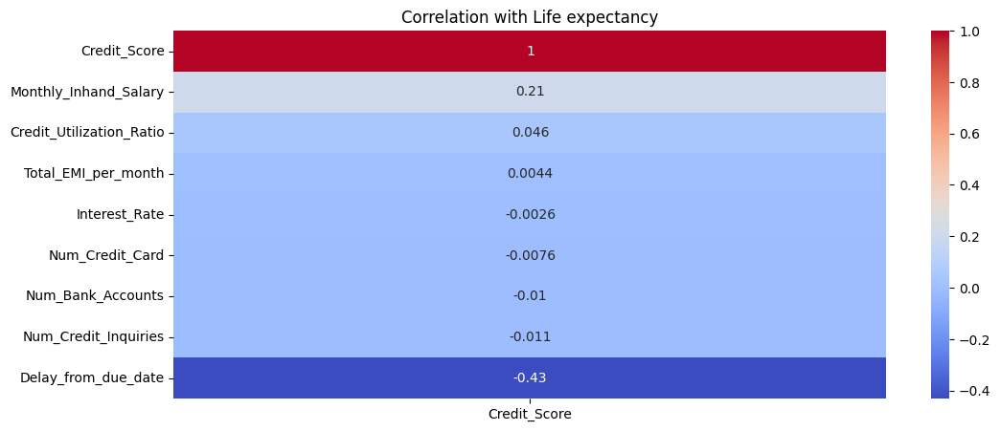

In [537]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr_df = df_train.corr()[['Credit_Score']].sort_values('Credit_Score', ascending=False)


fig, ax = plt.subplots(figsize=(12, 5))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation with Life expectancy")
plt.show()

In [538]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [539]:
df_train.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [540]:
df_train['Annual_Income'].info()
df_train['Annual_Income'].describe()
print(df_train['Annual_Income'].min())
print(df_train['Annual_Income'].max())
print(df_train['Annual_Income'].sort_values().head())

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Annual_Income
Non-Null Count   Dtype 
--------------   ----- 
100000 non-null  object
dtypes: object(1)
memory usage: 781.4+ KB
10001727.0
99995.22
93418    10001727.0
25078     10003.495
25076     10003.495
25075     10003.495
25074     10003.495
Name: Annual_Income, dtype: object


In [541]:
df_train['Annual_Income'] = pd.to_numeric(df_train['Annual_Income'].str.replace('[^\d.]', ''))


C:\Users\User\AppData\Local\Temp\ipykernel_17980\3976904185.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [542]:
print(df_train['Annual_Income'].min())
print(df_train['Annual_Income'].max())
print(df_train['Annual_Income'].sort_values().head())
print(df_train['Annual_Income'].sort_values().tail(1000))

7005.93
24198062.0
39675    7005.93
39674    7005.93
39673    7005.93
39676    7005.93
39677    7005.93
Name: Annual_Income, dtype: float64
15691      179987.28
70085      251889.00
98852      265962.00
50605      267236.00
45977      273093.00
            ...     
27262    24105369.00
14588    24160009.00
59059    24177153.00
7814     24188807.00
48302    24198062.00
Name: Annual_Income, Length: 1000, dtype: float64


In [543]:
print(df_train['Monthly_Inhand_Salary'].sort_values().head())
print(df_train['Monthly_Inhand_Salary'].max())

83645    303.645417
83647    303.645417
83646    303.645417
83644    303.645417
83643    303.645417
Name: Monthly_Inhand_Salary, dtype: float64
15204.633333333331


In [544]:
# Calculate the correlation coefficient
df_filtered = df_train[df_train['Annual_Income'] < 180000]
corr_coef = df_filtered['Annual_Income'].corr(df_train['Monthly_Inhand_Salary'])

print('Correlation coefficient:', corr_coef)

Correlation coefficient: 0.9981917378223611


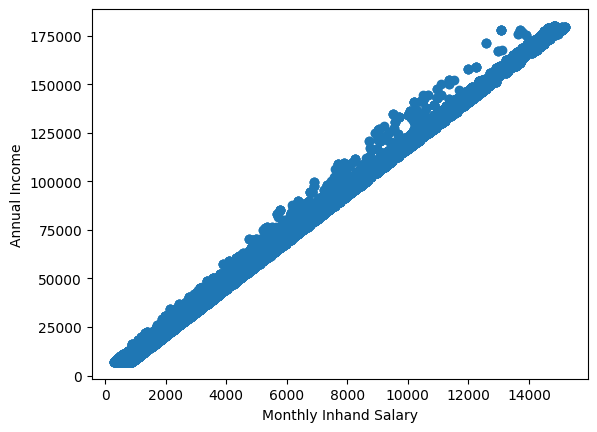

In [545]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the data for annual incomes less than 100k
df_filtered = df_train[df_train['Annual_Income'] < 180000]

# Plot a scatter plot of Monthly_Inhand_Salary against Annual_Income
plt.scatter(df_filtered['Monthly_Inhand_Salary'], df_filtered['Annual_Income'])
plt.xlabel('Monthly Inhand Salary')
plt.ylabel('Annual Income')
plt.show()

In [546]:
print(df_train['Monthly_Inhand_Salary'].isnull().sum())
print(df_train[df_train['Monthly_Inhand_Salary'].isnull() & (df_train['Annual_Income'] < 180000)]['Annual_Income'])


15002
1        19114.12
2        19114.12
3        19114.12
5        19114.12
11       34847.84
           ...   
99944    59146.36
99955    38321.39
99963    42903.79
99975    16680.35
99978    37188.10
Name: Annual_Income, Length: 14855, dtype: float64


In [547]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


# Filter the data
df_filtered = df_train[df_train['Annual_Income'] < 180000]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    df_filtered.loc[df_filtered['Monthly_Inhand_Salary'].notnull(), 'Annual_Income'].values.reshape(-1, 1),
    df_filtered.loc[df_filtered['Monthly_Inhand_Salary'].notnull(), 'Monthly_Inhand_Salary'].values.reshape(-1, 1),
    test_size=0.3,
    random_state=42
)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on testing set
y_pred = model.predict(X_test)

# Print evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print('MSE:', mse)
print('RMSE:', rmse)
print('R2:', r2)

MSE: 36320.81283907548
RMSE: 190.58020054317154
R2: 0.9963847758800946


In [548]:
# Filter the data
df_filtered = df_train[df_train['Annual_Income'] <= 180000]

# Split the data into training and testing sets
X_train = df_train.loc[df_train['Monthly_Inhand_Salary'].notnull() & (df_train['Annual_Income'] <= 180000), 'Annual_Income'].values.reshape(-1, 1)
y_train = df_train.loc[df_train['Monthly_Inhand_Salary'].notnull() & (df_train['Annual_Income'] <= 180000), 'Monthly_Inhand_Salary'].values.reshape(-1, 1)

# Split the data into testing set
X_test = df_train.loc[df_train['Monthly_Inhand_Salary'].isnull() & (df_train['Annual_Income'] <= 180000), 'Annual_Income'].values.reshape(-1, 1)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict the missing values
y_pred = model.predict(X_test)

# Fill the missing values with predicted values
df_train.loc[df_train['Monthly_Inhand_Salary'].isnull() & (df_train['Annual_Income'] <= 180000), 'Monthly_Inhand_Salary'] = y_pred

# Fill the remaining missing values with mean
mean = df_train['Monthly_Inhand_Salary'].mean()
df_train['Monthly_Inhand_Salary'] = df_train['Monthly_Inhand_Salary'].fillna(mean)

print('Monthly_Inhand_Salary null values count:',df_train['Monthly_Inhand_Salary'].isnull().sum())


Monthly_Inhand_Salary null values count: 0


In [549]:
print(df_train['Num_Bank_Accounts'].info())
print(df_train['Num_Bank_Accounts'].describe())
print(df_train['Num_Bank_Accounts'].min())
print(df_train['Num_Bank_Accounts'].max())
print(df_train['Num_Bank_Accounts'].sort_values().head(10000))
print(df_train['Num_Bank_Accounts'].sort_values().tail(10000))


<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Num_Bank_Accounts
Non-Null Count   Dtype
--------------   -----
100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB
None
count    100000.000000
mean         17.091280
std         117.404834
min          -1.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64
-1
1798
30334   -1
30335   -1
47215   -1
47214   -1
47213   -1
        ..
50289    2
50290    2
50291    2
50292    2
50293    2
Name: Num_Bank_Accounts, Length: 10000, dtype: int64
21358       9
21359       9
25688       9
2525        9
20549       9
         ... 
35195    1793
29242    1794
69059    1794
20277    1798
64537    1798
Name: Num_Bank_Accounts, Length: 10000, dtype: int64


In [550]:
import plotly.express as px

fig = px.histogram(df_train, x='Num_Bank_Accounts', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Bank Accounts')
fig.show()




In [551]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[df_train['Num_Bank_Accounts'] > 12].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 11'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()




In [552]:
# Calculate median value of Num_Bank_Accounts column
median_value = df_train['Num_Bank_Accounts'].median()

# Replace the values in the specified rows with median value
df_train.loc[df_train['Num_Bank_Accounts'] > 12, 'Num_Bank_Accounts'] = median_value
df_train[df_train['Num_Bank_Accounts'] > 12]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label


In [553]:

print(df_train['Num_Credit_Card'].info())
print(df_train['Num_Credit_Card'].describe())
print(df_train['Num_Credit_Card'].min())
print(df_train['Num_Credit_Card'].max())
print(df_train['Num_Credit_Card'].sort_values().tail(10))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Num_Credit_Card
Non-Null Count   Dtype
--------------   -----
100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB
None
count    100000.00000
mean         22.47443
std         129.05741
min           0.00000
25%           4.00000
50%           5.00000
75%           7.00000
max        1499.00000
Name: Num_Credit_Card, dtype: float64
0
1499
50637    1496
97667    1496
57286    1497
30807    1497
26860    1497
77711    1498
18343    1498
62075    1498
25015    1499
72123    1499
Name: Num_Credit_Card, dtype: int64


In [554]:
import plotly.express as px

fig = px.histogram(df_train, x='Num_Credit_Card', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Credit Cards')
fig.show()

In [555]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[df_train['Num_Credit_Card'] > 12].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 12'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()

In [556]:
# Calculate median value of Num_Bank_Accounts column
median_value = df_train['Num_Credit_Card'].median()


# Replace the values in the specified rows with median value
df_train.loc[df_train['Num_Credit_Card'] > 12, 'Num_Credit_Card'] = median_value
df_train[df_train['Num_Credit_Card'] > 12]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label


In [557]:

print(df_train['Interest_Rate'].info())
print(df_train['Interest_Rate'].describe())
print(df_train['Interest_Rate'].min())
print(df_train['Interest_Rate'].max())
print(df_train['Interest_Rate'].sort_values().tail(2000))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Interest_Rate
Non-Null Count   Dtype
--------------   -----
100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB
None
count    100000.000000
mean         72.466040
std         466.422621
min           1.000000
25%           8.000000
50%          13.000000
75%          20.000000
max        5797.000000
Name: Interest_Rate, dtype: float64
1
5797
40109     136
91544     137
26737     140
14186     142
58772     144
         ... 
77710    5775
88505    5776
23512    5788
73583    5789
71641    5797
Name: Interest_Rate, Length: 2000, dtype: int64


In [558]:
import plotly.express as px

# Filter the dataframe to include only rows where Interest_Rate is greater than 34
df_filtered = df_train[df_train['Interest_Rate'] > 34]

# Create a histogram of the filtered data
fig = px.histogram(df_filtered, x='Interest_Rate', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Credit Cards with Interest Rate > 30',width=950)
fig.show()
num_values_bigger_than_34 = df_train[df_train['Interest_Rate'] > 34]['Interest_Rate'].count()
print(num_values_bigger_than_34)

2034


In [559]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[df_train['Interest_Rate'] == 34].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 34'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()

In [560]:
# Calculate median value of Num_Bank_Accounts column
median_value = df_train['Interest_Rate'].median()


# Replace the values in the specified rows with median value
df_train.loc[df_train['Interest_Rate'] > 34, 'Interest_Rate'] = median_value
df_train[df_train['Interest_Rate'] > 34]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Label


In [561]:
print(df_train['Num_of_Loan'].info())
print(df_train['Num_of_Loan'].describe())
print(df_train['Num_of_Loan'].min())
print(df_train['Num_of_Loan'].max())
print(df_train['Num_of_Loan'].sort_values().tail(50))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Num_of_Loan
Non-Null Count   Dtype 
--------------   ----- 
100000 non-null  object
dtypes: object(1)
memory usage: 781.4+ KB
None
count     100000
unique       434
top            3
freq       14386
Name: Num_of_Loan, dtype: object
-100
9_
59049    9_
32571    9_
16833    9_
73758    9_
23602    9_
10853    9_
42905    9_
10862    9_
391      9_
18190    9_
23459    9_
23457    9_
56590    9_
47704    9_
22013    9_
78897    9_
18747    9_
72482    9_
86460    9_
82063    9_
79644    9_
70380    9_
65360    9_
70376    9_
91617    9_
91618    9_
79641    9_
91621    9_
68060    9_
3353     9_
52182    9_
19107    9_
21802    9_
70283    9_
40307    9_
10399    9_
43397    9_
37534    9_
13213    9_
28543    9_
8125     9_
32512    9_
54127    9_
26669    9_
89777    9_
97773    9_
21777    9_
32523    9_
4907     9_
17302    9_
Name: Num_of_Loan, dtype: object


In [562]:
df_train['Num_of_Loan'] = df_train['Num_of_Loan'].apply(lambda x: x[:-1] if not x[-1].isdigit() else x)

In [563]:
# Assuming the column name is 'Num_of_Loan'
num_loan = df_train['Num_of_Loan']

# Convert to numeric
num_loan_numeric = pd.to_numeric(num_loan, errors='coerce')

df_train['Num_of_Loan'] = pd.to_numeric(df_train['Num_of_Loan'], errors='coerce')


# Check how many rows are numeric
print('Number of numeric rows:', num_loan_numeric.notnull().sum())

print(df_train['Num_of_Loan'].describe())



Number of numeric rows: 100000
count    100000.000000
mean          3.009960
std          62.647879
min        -100.000000
25%           1.000000
50%           3.000000
75%           5.000000
max        1496.000000
Name: Num_of_Loan, dtype: float64


In [564]:
import plotly.express as px

# Filter the dataframe to include only rows where Interest_Rate is greater than 9
df_filtered = df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)]


# Create a histogram of the filtered data
fig = px.histogram(df_filtered, x='Num_of_Loan', nbins=50,
                   template='plotly_dark',
                   title='Distribution of Number of Credit Cards with Nummer of Loan > 9 and Nummer of Loan < 0  ',width=950)
fig.show()
num_values_bigger_than_9 = df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)]['Num_of_Loan'].count()
print(num_values_bigger_than_9)

4348


In [565]:
import pandas as pd
import plotly.express as px

bigger10_df = df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)].copy()

# Add a "Label" column to each dataset
df_train['Label'] = 'All bank account'
bigger10_df['Label'] = 'Bigger than 9 and lower then 0'

# Combine the two datasets into one
combined_df = pd.concat([df_train, bigger10_df], ignore_index=True)

# Create the violin plot
fig = px.violin(combined_df, x='Label', y='Credit_Score', color='Label',
                template='plotly_dark', 
                title='Percentage Distribution by Label',width=750)

# Show the plot
fig.show()

In [566]:
df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)]['Type_of_Loan']

21                 Auto Loan, Auto Loan, and Not Specified
31                                           Not Specified
34                                                     NaN
39                                                     NaN
53                  Credit-Builder Loan, and Mortgage Loan
                               ...                        
99901                                        Not Specified
99902                                        Not Specified
99919    Home Equity Loan, Payday Loan, Not Specified, ...
99969    Payday Loan, Student Loan, Mortgage Loan, and ...
99987    Personal Loan, Auto Loan, Mortgage Loan, Stude...
Name: Type_of_Loan, Length: 4348, dtype: object

In [567]:
print(df_train['Type_of_Loan'].info())
print(df_train['Type_of_Loan'].describe())
print('Sum of nan values:',df_train['Type_of_Loan'].isnull().sum())
freq_table = df_train['Type_of_Loan'].value_counts()
print(freq_table.tail(20))

<class 'pandas.core.series.Series'>
RangeIndex: 100000 entries, 0 to 99999
Series name: Type_of_Loan
Non-Null Count  Dtype 
--------------  ----- 
88592 non-null  object
dtypes: object(1)
memory usage: 781.4+ KB
None
count             88592
unique             6260
top       Not Specified
freq               1408
Name: Type_of_Loan, dtype: object
Sum of nan values: 11408
Home Equity Loan, Payday Loan, Credit-Builder Loan, Auto Loan, and Payday Loan                                                                  8
Debt Consolidation Loan, Personal Loan, Mortgage Loan, Personal Loan, Not Specified, Mortgage Loan, and Home Equity Loan                        8
Auto Loan, Credit-Builder Loan, Student Loan, and Student Loan                                                                                  8
Personal Loan, Student Loan, Not Specified, Debt Consolidation Loan, and Student Loan                                                           8
Mortgage Loan, Credit-Builder Loan, Mortgage

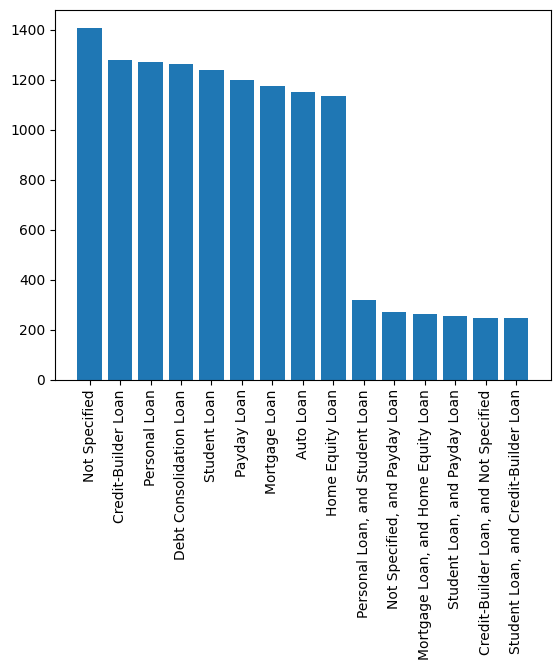

In [568]:
value_counts = df_train['Type_of_Loan'].value_counts()
value_counts_filtered = value_counts[value_counts > 240]

plt.bar(value_counts_filtered.index, value_counts_filtered.values)
plt.xticks(rotation=90)
plt.show()

In [569]:
value=df_train['Num_of_Loan'].median()
df_train['Type_of_Loan'] = df_train['Type_of_Loan'].fillna(value)

# Count number of elements separated by comma
num_elements = df_train['Type_of_Loan'].astype(str).apply(lambda x: x.count(',') + 1 if x!= 'Not Specified'  else 0)

# Create new column
df_train = df_train.assign(Num_of_Loan_Types=num_elements)

# Replace the values in the specified rows with Num_of_Loan_Types cloumn value
df_train.loc[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0), 'Num_of_Loan'] = df_train['Num_of_Loan_Types']
print(df_train[(df_train['Num_of_Loan'] > 9) | (df_train['Num_of_Loan'] < 0)])


# Check the correlation between the two columns
corr = df_train['Num_of_Loan'].corr(df_train['Num_of_Loan_Types'])

print('Correlation between Num_of_Loan and Num_of_Loan_Types_int:', corr)
df_train['Num_of_Loan'].describe()

Empty DataFrame
Columns: [ID, Customer_ID, Month, Name, Age, SSN, Occupation, Annual_Income, Monthly_Inhand_Salary, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Type_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Credit_Mix, Outstanding_Debt, Credit_Utilization_Ratio, Credit_History_Age, Payment_of_Min_Amount, Total_EMI_per_month, Amount_invested_monthly, Payment_Behaviour, Monthly_Balance, Credit_Score, Label, Num_of_Loan_Types]
Index: []

[0 rows x 30 columns]
Correlation between Num_of_Loan and Num_of_Loan_Types_int: 0.9913333441480534


count    100000.000000
mean          3.536980
std           2.441264
min           0.000000
25%           2.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: Num_of_Loan, dtype: float64

C:\Users\User\AppData\Local\Temp\ipykernel_17980\2117790107.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



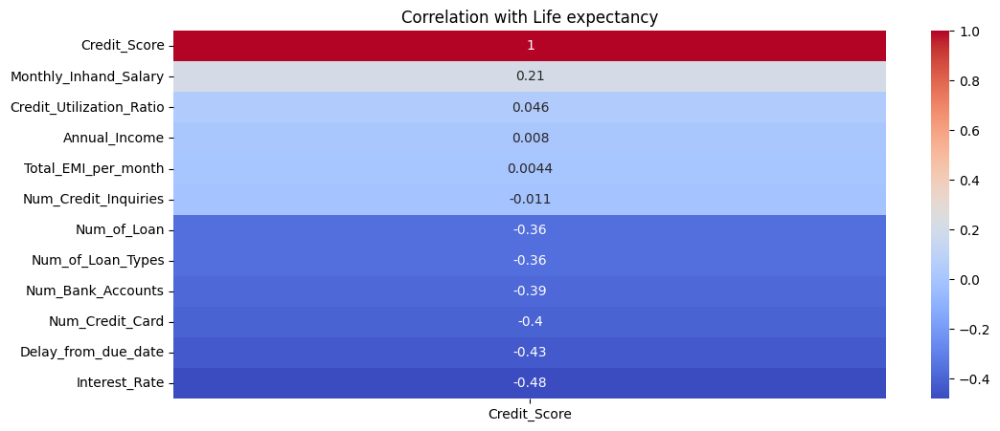

In [570]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr_df = df_train.corr()[['Credit_Score']].sort_values('Credit_Score', ascending=False)


fig, ax = plt.subplots(figsize=(12, 5))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation with Life expectancy")
plt.show()